# Interpretable DNN model for kinase family inhibitors prediction

This code is to build deep neural networks to predict kinase family inhibitors and interpret the model to understand the characteristics of kinase family inhibitors. This is very important for the drug design of the kinase.

In [1]:
########### import package ###########
import numpy as np
from keras.utils import np_utils
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from keras.layers import Dense, Activation, Dropout
from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers
from keras import regularizers
import tensorflow as tf
import os

Using TensorFlow backend.
C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\bboyf\Anaconda3\envs

## Setting GPU
The GUP of NVIDIA is used here.

In [2]:
# Number of GPU 
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Auto
#gpu_options = tf.GPUOptions(allow_growth=True)
 
# Set what proportion of GPU to use
gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.5)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

tf.keras.backend.set_session(sess)

## Build DNN model and hyperparameters setting

---------------------- Data information ----------------------
EGFR_data:
                            0    1    2    3    4    5    6    7    8    9    \
0  AAGKMGNYUYCEPD-UHFFFAOYSA-N    1    0    0    0    0    0    0    0    0   
1  AAWZYZGJDOSLSU-NSHDSACASA-N    1    0    0    0    0    0    0    0    0   
2  AAYJEKJTXVXYTO-UHFFFAOYSA-N    1    0    0    0    0    0    0    0    0   
3  AAYZTFLAQXDFOL-UHFFFAOYSA-N    0    0    0    0    0    0    0    0    0   
4  ABXIBRWZRWHJCZ-KBPBESRZSA-N    1    0    0    0    0    0    0    0    0   
5  ABXIBRWZRWHJCZ-UONOGXRCSA-N    1    0    0    0    0    0    0    0    0   
6  ACEREWSFULKZGV-UHFFFAOYSA-N    1    0    0    0    0    0    0    0    0   
7  ACGUYXCXAPNIKK-UHFFFAOYSA-N    0    0    0    0    0    0    0    0    0   
8  ACNCCUVYXQGPKZ-UHFFFAOYSA-N    0    0    0    0    0    0    0    0    0   
9  ACNYXAIBELJFSP-JLHYYAGUSA-N    1    0    0    0    0    0    0    0    0   

   ...  230  231  232  233  234  235  236  237  238  23

C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '



Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 2s - loss: 8.5463 - accuracy: 0.8758 - val_loss: 5.9419 - val_accuracy: 0.6678
Epoch 2/100
 - 0s - loss: 3.6954 - accuracy: 0.9392 - val_loss: 2.6826 - val_accuracy: 0.6346
Epoch 3/100
 - 0s - loss: 1.5067 - accuracy: 0.9442 - val_loss: 1.4587 - val_accuracy: 0.5083
Epoch 4/100
 - 0s - loss: 0.7298 - accuracy: 0.9492 - val_loss: 1.0543 - val_accuracy: 0.8372
Epoch 5/100
 - 0s - loss: 0.4578 - accuracy: 0.9517 - val_loss: 0.8892 - val_accuracy: 0.8937
Epoch 6/100
 - 0s - loss: 0.3595 - accuracy: 0.9517 - val_loss: 0.8142 - val_accuracy: 0.8671
Epoch 7/100
 - 0s - loss: 0.3105 - accuracy: 0.9592 - val_loss: 0.7624 - val_accuracy: 0.8804
Epoch 8/100
 - 0s - loss: 0.2935 - accuracy: 0.9542 - val_loss: 0.7461 - val_accuracy: 0.9203
Epoch 9/100
 - 0s - loss: 0.2955 - accuracy: 0.9533 - val_loss: 0.6532 - val_accuracy: 0.8970
Epoch 10/100
 - 0s - loss: 0.2573 - accuracy: 0.9675 - val_loss: 0.6520 - val_accuracy: 0.9103
Epoch 11/10

Epoch 85/100
 - 0s - loss: 0.0644 - accuracy: 0.9850 - val_loss: 0.3306 - val_accuracy: 0.9136
Epoch 86/100
 - 0s - loss: 0.0663 - accuracy: 0.9842 - val_loss: 0.3289 - val_accuracy: 0.9136
Epoch 87/100
 - 0s - loss: 0.0642 - accuracy: 0.9858 - val_loss: 0.3294 - val_accuracy: 0.9136
Epoch 88/100
 - 0s - loss: 0.0682 - accuracy: 0.9833 - val_loss: 0.3309 - val_accuracy: 0.9136
Epoch 89/100
 - 0s - loss: 0.0643 - accuracy: 0.9842 - val_loss: 0.3292 - val_accuracy: 0.9136
Epoch 90/100
 - 0s - loss: 0.0639 - accuracy: 0.9850 - val_loss: 0.3287 - val_accuracy: 0.9136
Epoch 91/100
 - 0s - loss: 0.0634 - accuracy: 0.9825 - val_loss: 0.3229 - val_accuracy: 0.9136
Epoch 92/100
 - 0s - loss: 0.0625 - accuracy: 0.9825 - val_loss: 0.3264 - val_accuracy: 0.9136
Epoch 93/100
 - 0s - loss: 0.0636 - accuracy: 0.9858 - val_loss: 0.3287 - val_accuracy: 0.9136
Epoch 94/100
 - 0s - loss: 0.0641 - accuracy: 0.9825 - val_loss: 0.3317 - val_accuracy: 0.9136
Epoch 95/100
 - 0s - loss: 0.0633 - accuracy: 0.98

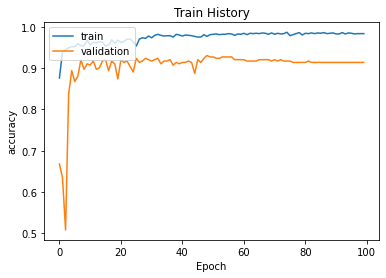

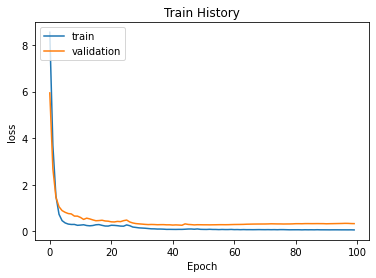

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_1.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 99us/step
check4: 1
** test loss: 0.3298059174871425
** test accuracy: 0.9136212468147278


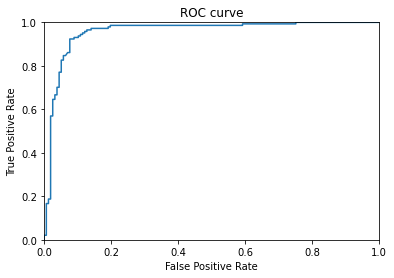


Acc : 0.914
Sen :  0.938
Spe :  0.892
AUC : 0.957
MCC : 0.828
f1-score : 0.912
Confusion_Matrix : 
 [[140  17]
 [  9 135]] 


============================= CV 2 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 560
n: 640
##test:
p: 132
n: 169
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 1s - loss: 8.4296 - accuracy: 0.8775 - val_loss: 5.7319 - val_accuracy: 0.6611
Epoch 2/100
 - 0s - loss: 3.4966 - accuracy: 0.9350 - val_loss: 2.5096 - val_accuracy: 0.9136
Epoch 3/100
 - 0s - loss: 1.3870 - accuracy: 0.9417 - val_loss: 1.3744 - val_accuracy: 0.7807
Epoch 4/100
 - 0s - loss: 0.7084 - accuracy: 0.9367 - val_loss: 0.9879 - val_accuracy: 0.7940
Epoch 5/100
 - 0s - loss: 0.4451 - accuracy: 0.9525 - val_loss: 0.8660 - val_accuracy: 0.6512
Epoch 6/100
 - 0s - loss: 0.3540 - accuracy: 0.9425 - val_loss: 0.7952 - val_accuracy: 0.5681
Epoch 7/100
 - 0s - loss: 0.3075 - accuracy: 0.9550 - val_loss: 0.7414 - val_accuracy: 0.7741
Epoch 8/100
 - 0s - loss: 0.2771 - accuracy: 0.9508 - val_loss: 0.7025 - val_accuracy: 0.6478
Epoch 9/100
 - 0s - loss: 0.2973 - accuracy: 0.9542 - val_loss: 0.6648 - val_accuracy: 0.8106
Epoch 10/100
 - 0s - loss: 0.3121 - accuracy: 0.9483 - val_loss: 0.6533 - val_accuracy: 0.8538
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0610 - accuracy: 0.9808 - val_loss: 0.3212 - val_accuracy: 0.9302
Epoch 88/100
 - 0s - loss: 0.0622 - accuracy: 0.9808 - val_loss: 0.3207 - val_accuracy: 0.9302
Epoch 89/100
 - 0s - loss: 0.0609 - accuracy: 0.9817 - val_loss: 0.3219 - val_accuracy: 0.9302
Epoch 90/100
 - 0s - loss: 0.0601 - accuracy: 0.9800 - val_loss: 0.3180 - val_accuracy: 0.9302
Epoch 91/100
 - 0s - loss: 0.0595 - accuracy: 0.9817 - val_loss: 0.3175 - val_accuracy: 0.9302
Epoch 92/100
 - 0s - loss: 0.0599 - accuracy: 0.9842 - val_loss: 0.3165 - val_accuracy: 0.9236
Epoch 93/100
 - 0s - loss: 0.0616 - accuracy: 0.9817 - val_loss: 0.3201 - val_accuracy: 0.9236
Epoch 94/100
 - 0s - loss: 0.0603 - accuracy: 0.9817 - val_loss: 0.3204 - val_accuracy: 0.9269
Epoch 95/100
 - 0s - loss: 0.0627 - accuracy: 0.9792 - val_loss: 0.3243 - val_accuracy: 0.9269
Epoch 96/100
 - 0s - loss: 0.0611 - accuracy: 0.9808 - val_loss: 0.3247 - val_accuracy: 0.9302
Epoch 97/100
 - 0s - loss: 0.0615 - accuracy: 0.98

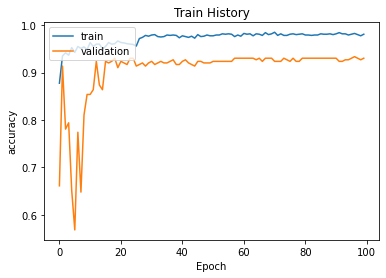

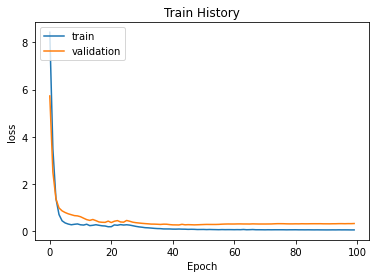

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_2.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 146us/step
check4: 2
** test loss: 0.33013424307008915
** test accuracy: 0.930232584476471


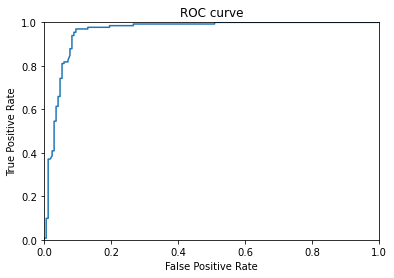


Acc : 0.93
Sen :  0.97
Spe :  0.899
AUC : 0.958
MCC : 0.863
f1-score : 0.924
Confusion_Matrix : 
 [[152  17]
 [  4 128]] 


============================= CV 3 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 556
n: 644
##test:
p: 136
n: 165
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 1s - loss: 8.4492 - accuracy: 0.8775 - val_loss: 5.7963 - val_accuracy: 0.6611
Epoch 2/100
 - 0s - loss: 3.5842 - accuracy: 0.9250 - val_loss: 2.5720 - val_accuracy: 0.8937
Epoch 3/100
 - 0s - loss: 1.4336 - accuracy: 0.9433 - val_loss: 1.4111 - val_accuracy: 0.6379
Epoch 4/100
 - 0s - loss: 0.7053 - accuracy: 0.9442 - val_loss: 1.0096 - val_accuracy: 0.7973
Epoch 5/100
 - 0s - loss: 0.4348 - accuracy: 0.9583 - val_loss: 0.8473 - val_accuracy: 0.5847
Epoch 6/100
 - 0s - loss: 0.3830 - accuracy: 0.9392 - val_loss: 0.7882 - val_accuracy: 0.7209
Epoch 7/100
 - 0s - loss: 0.3045 - accuracy: 0.9525 - val_loss: 0.7126 - val_accuracy: 0.7043
Epoch 8/100
 - 0s - loss: 0.2780 - accuracy: 0.9625 - val_loss: 0.7070 - val_accuracy: 0.6179
Epoch 9/100
 - 0s - loss: 0.2826 - accuracy: 0.9533 - val_loss: 0.5802 - val_accuracy: 0.8605
Epoch 10/100
 - 0s - loss: 0.2823 - accuracy: 0.9592 - val_loss: 0.5309 - val_accuracy: 0.8904
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0812 - accuracy: 0.9833 - val_loss: 0.3809 - val_accuracy: 0.9103
Epoch 88/100
 - 0s - loss: 0.0837 - accuracy: 0.9808 - val_loss: 0.3807 - val_accuracy: 0.9103
Epoch 89/100
 - 0s - loss: 0.0792 - accuracy: 0.9850 - val_loss: 0.3624 - val_accuracy: 0.9103
Epoch 90/100
 - 0s - loss: 0.0779 - accuracy: 0.9833 - val_loss: 0.3689 - val_accuracy: 0.9136
Epoch 91/100
 - 0s - loss: 0.0798 - accuracy: 0.9842 - val_loss: 0.3711 - val_accuracy: 0.9136
Epoch 92/100
 - 0s - loss: 0.0805 - accuracy: 0.9850 - val_loss: 0.3752 - val_accuracy: 0.9103
Epoch 93/100
 - 0s - loss: 0.0750 - accuracy: 0.9867 - val_loss: 0.3703 - val_accuracy: 0.9103
Epoch 94/100
 - 0s - loss: 0.0774 - accuracy: 0.9842 - val_loss: 0.3689 - val_accuracy: 0.9103
Epoch 95/100
 - 0s - loss: 0.0754 - accuracy: 0.9842 - val_loss: 0.3745 - val_accuracy: 0.9070
Epoch 96/100
 - 0s - loss: 0.0802 - accuracy: 0.9833 - val_loss: 0.3771 - val_accuracy: 0.9070
Epoch 97/100
 - 0s - loss: 0.0751 - accuracy: 0.98

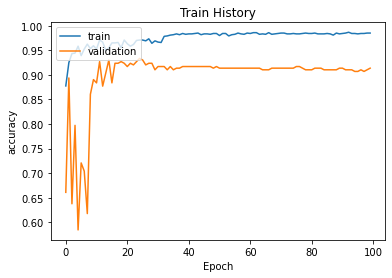

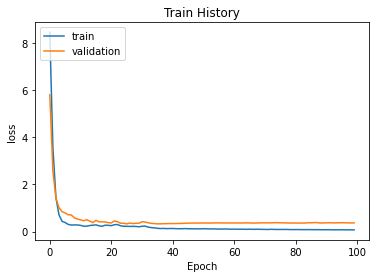

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_3.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 96us/step
check4: 3
** test loss: 0.3694714561253291
** test accuracy: 0.9136212468147278


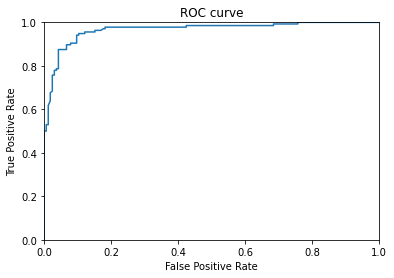


Acc : 0.914
Sen :  0.89
Spe :  0.933
AUC : 0.966
MCC : 0.825
f1-score : 0.903
Confusion_Matrix : 
 [[154  11]
 [ 15 121]] 


============================= CV 4 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 562
n: 638
##test:
p: 130
n: 171
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 1s - loss: 8.4688 - accuracy: 0.8750 - val_loss: 5.8450 - val_accuracy: 0.5116
Epoch 2/100
 - 0s - loss: 3.6257 - accuracy: 0.9375 - val_loss: 2.6101 - val_accuracy: 0.4618
Epoch 3/100
 - 0s - loss: 1.4516 - accuracy: 0.9425 - val_loss: 1.4392 - val_accuracy: 0.4319
Epoch 4/100
 - 0s - loss: 0.7235 - accuracy: 0.9467 - val_loss: 1.0361 - val_accuracy: 0.7342
Epoch 5/100
 - 0s - loss: 0.4560 - accuracy: 0.9533 - val_loss: 0.9000 - val_accuracy: 0.4452
Epoch 6/100
 - 0s - loss: 0.3363 - accuracy: 0.9608 - val_loss: 0.8153 - val_accuracy: 0.5116
Epoch 7/100
 - 0s - loss: 0.2959 - accuracy: 0.9575 - val_loss: 0.7525 - val_accuracy: 0.7110
Epoch 8/100
 - 0s - loss: 0.3343 - accuracy: 0.9433 - val_loss: 0.6786 - val_accuracy: 0.8671
Epoch 9/100
 - 0s - loss: 0.2803 - accuracy: 0.9692 - val_loss: 0.6629 - val_accuracy: 0.8239
Epoch 10/100
 - 0s - loss: 0.2318 - accuracy: 0.9633 - val_loss: 0.6194 - val_accuracy: 0.9103
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0596 - accuracy: 0.9858 - val_loss: 0.3248 - val_accuracy: 0.9302
Epoch 88/100
 - 0s - loss: 0.0628 - accuracy: 0.9825 - val_loss: 0.3283 - val_accuracy: 0.9336
Epoch 89/100
 - 0s - loss: 0.0567 - accuracy: 0.9867 - val_loss: 0.3260 - val_accuracy: 0.9336
Epoch 90/100
 - 0s - loss: 0.0602 - accuracy: 0.9850 - val_loss: 0.3341 - val_accuracy: 0.9302
Epoch 91/100
 - 0s - loss: 0.0607 - accuracy: 0.9833 - val_loss: 0.3298 - val_accuracy: 0.9336
Epoch 92/100
 - 0s - loss: 0.0568 - accuracy: 0.9833 - val_loss: 0.3306 - val_accuracy: 0.9336
Epoch 93/100
 - 0s - loss: 0.0627 - accuracy: 0.9842 - val_loss: 0.3261 - val_accuracy: 0.9336
Epoch 94/100
 - 0s - loss: 0.0573 - accuracy: 0.9850 - val_loss: 0.3244 - val_accuracy: 0.9336
Epoch 95/100
 - 0s - loss: 0.0596 - accuracy: 0.9842 - val_loss: 0.3233 - val_accuracy: 0.9336
Epoch 96/100
 - 0s - loss: 0.0579 - accuracy: 0.9842 - val_loss: 0.3279 - val_accuracy: 0.9336
Epoch 97/100
 - 0s - loss: 0.0607 - accuracy: 0.98

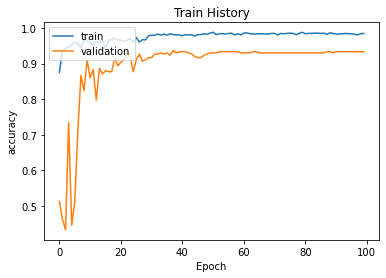

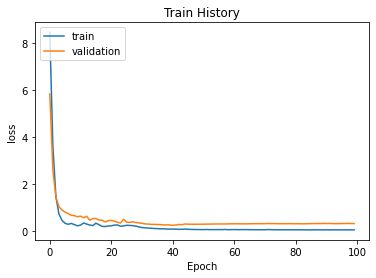

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_4.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 182us/step
check4: 4
** test loss: 0.32499442431469294
** test accuracy: 0.9335548281669617


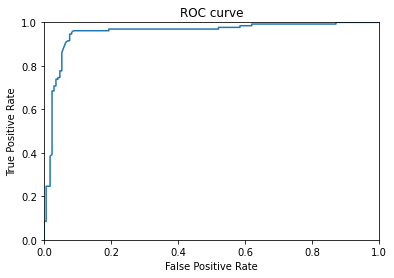


Acc : 0.934
Sen :  0.962
Spe :  0.912
AUC : 0.953
MCC : 0.868
f1-score : 0.926
Confusion_Matrix : 
 [[156  15]
 [  5 125]] 


============================= CV 5 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 565
n: 635
##test:
p: 127
n: 174
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 1s - loss: 8.4054 - accuracy: 0.8875 - val_loss: 5.7478 - val_accuracy: 0.5980
Epoch 2/100
 - 0s - loss: 3.5218 - accuracy: 0.9458 - val_loss: 2.5259 - val_accuracy: 0.8837
Epoch 3/100
 - 0s - loss: 1.4112 - accuracy: 0.9383 - val_loss: 1.3658 - val_accuracy: 0.8704
Epoch 4/100
 - 0s - loss: 0.6855 - accuracy: 0.9483 - val_loss: 1.0087 - val_accuracy: 0.8671
Epoch 5/100
 - 0s - loss: 0.4467 - accuracy: 0.9483 - val_loss: 0.8369 - val_accuracy: 0.8206
Epoch 6/100
 - 0s - loss: 0.3537 - accuracy: 0.9517 - val_loss: 0.7741 - val_accuracy: 0.6213
Epoch 7/100
 - 0s - loss: 0.2835 - accuracy: 0.9617 - val_loss: 0.7344 - val_accuracy: 0.5980
Epoch 8/100
 - 0s - loss: 0.2790 - accuracy: 0.9525 - val_loss: 0.6872 - val_accuracy: 0.6611
Epoch 9/100
 - 0s - loss: 0.2768 - accuracy: 0.9492 - val_loss: 0.6588 - val_accuracy: 0.7309
Epoch 10/100
 - 0s - loss: 0.2468 - accuracy: 0.9633 - val_loss: 0.6452 - val_accuracy: 0.7442
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0539 - accuracy: 0.9867 - val_loss: 0.3845 - val_accuracy: 0.9070
Epoch 88/100
 - 0s - loss: 0.0498 - accuracy: 0.9867 - val_loss: 0.3894 - val_accuracy: 0.9037
Epoch 89/100
 - 0s - loss: 0.0505 - accuracy: 0.9867 - val_loss: 0.3853 - val_accuracy: 0.9070
Epoch 90/100
 - 0s - loss: 0.0517 - accuracy: 0.9850 - val_loss: 0.3862 - val_accuracy: 0.9070
Epoch 91/100
 - 0s - loss: 0.0518 - accuracy: 0.9875 - val_loss: 0.3898 - val_accuracy: 0.9070
Epoch 92/100
 - 0s - loss: 0.0513 - accuracy: 0.9850 - val_loss: 0.3862 - val_accuracy: 0.9070
Epoch 93/100
 - 0s - loss: 0.0488 - accuracy: 0.9867 - val_loss: 0.3818 - val_accuracy: 0.9003
Epoch 94/100
 - 0s - loss: 0.0497 - accuracy: 0.9850 - val_loss: 0.3817 - val_accuracy: 0.9003
Epoch 95/100
 - 0s - loss: 0.0498 - accuracy: 0.9867 - val_loss: 0.3856 - val_accuracy: 0.9037
Epoch 96/100
 - 0s - loss: 0.0514 - accuracy: 0.9842 - val_loss: 0.3718 - val_accuracy: 0.9003
Epoch 97/100
 - 0s - loss: 0.0495 - accuracy: 0.98

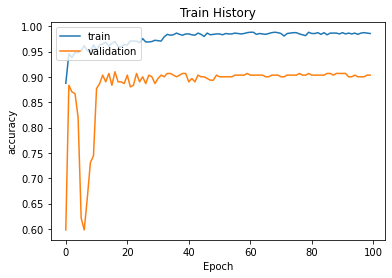

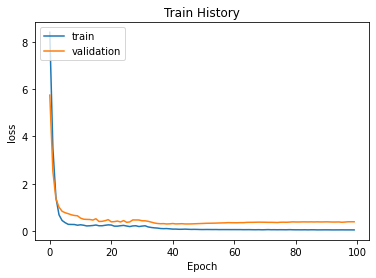

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_5.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 219us/step
check4: 5
** test loss: 0.39205765120214797
** test accuracy: 0.9036544561386108


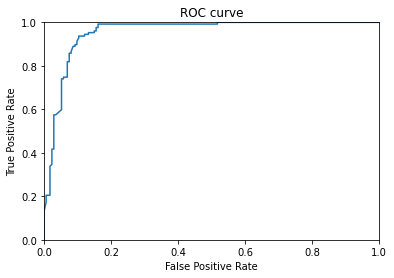


Acc : 0.904
Sen :  0.937
Spe :  0.879
AUC : 0.955
MCC : 0.808
f1-score : 0.891
Confusion_Matrix : 
 [[153  21]
 [  8 119]] 


============================= CV 6 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 542
n: 658
##test:
p: 150
n: 151
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 1s - loss: 8.3929 - accuracy: 0.8725 - val_loss: 5.7332 - val_accuracy: 0.5183
Epoch 2/100
 - 0s - loss: 3.5697 - accuracy: 0.9150 - val_loss: 2.5570 - val_accuracy: 0.7575
Epoch 3/100
 - 0s - loss: 1.4448 - accuracy: 0.9275 - val_loss: 1.3999 - val_accuracy: 0.6213
Epoch 4/100
 - 0s - loss: 0.7070 - accuracy: 0.9417 - val_loss: 1.0176 - val_accuracy: 0.7508
Epoch 5/100
 - 0s - loss: 0.4957 - accuracy: 0.9350 - val_loss: 0.8585 - val_accuracy: 0.7907
Epoch 6/100
 - 0s - loss: 0.3613 - accuracy: 0.9500 - val_loss: 0.7840 - val_accuracy: 0.9070
Epoch 7/100
 - 0s - loss: 0.3193 - accuracy: 0.9492 - val_loss: 0.7290 - val_accuracy: 0.8970
Epoch 8/100
 - 0s - loss: 0.2984 - accuracy: 0.9483 - val_loss: 0.6645 - val_accuracy: 0.9203
Epoch 9/100
 - 0s - loss: 0.2796 - accuracy: 0.9517 - val_loss: 0.6261 - val_accuracy: 0.9502
Epoch 10/100
 - 0s - loss: 0.2612 - accuracy: 0.9583 - val_loss: 0.5675 - val_accuracy: 0.9336
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0696 - accuracy: 0.9783 - val_loss: 0.2920 - val_accuracy: 0.9402
Epoch 88/100
 - 0s - loss: 0.0648 - accuracy: 0.9783 - val_loss: 0.2947 - val_accuracy: 0.9402
Epoch 89/100
 - 0s - loss: 0.0689 - accuracy: 0.9783 - val_loss: 0.2939 - val_accuracy: 0.9402
Epoch 90/100
 - 0s - loss: 0.0650 - accuracy: 0.9792 - val_loss: 0.2987 - val_accuracy: 0.9402
Epoch 91/100
 - 0s - loss: 0.0661 - accuracy: 0.9783 - val_loss: 0.2989 - val_accuracy: 0.9402
Epoch 92/100
 - 0s - loss: 0.0640 - accuracy: 0.9792 - val_loss: 0.2961 - val_accuracy: 0.9402
Epoch 93/100
 - 0s - loss: 0.0646 - accuracy: 0.9808 - val_loss: 0.2950 - val_accuracy: 0.9435
Epoch 94/100
 - 0s - loss: 0.0689 - accuracy: 0.9775 - val_loss: 0.2939 - val_accuracy: 0.9435
Epoch 95/100
 - 0s - loss: 0.0660 - accuracy: 0.9808 - val_loss: 0.2953 - val_accuracy: 0.9402
Epoch 96/100
 - 0s - loss: 0.0642 - accuracy: 0.9817 - val_loss: 0.2946 - val_accuracy: 0.9402
Epoch 97/100
 - 0s - loss: 0.0637 - accuracy: 0.97

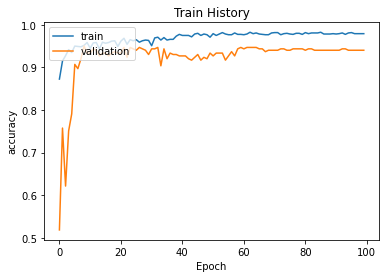

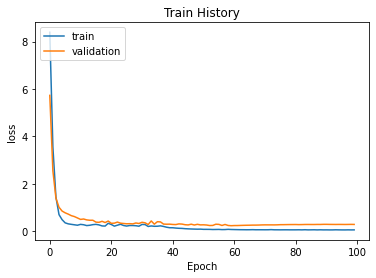

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_6.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 186us/step
check4: 6
** test loss: 0.2947981319207686
** test accuracy: 0.9401993155479431


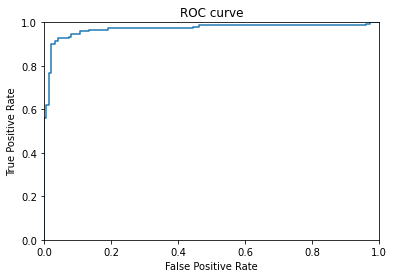


Acc : 0.94
Sen :  0.913
Spe :  0.967
AUC : 0.97
MCC : 0.882
f1-score : 0.938
Confusion_Matrix : 
 [[146   5]
 [ 13 137]] 


============================= CV 7 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 560
n: 640
##test:
p: 132
n: 169
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 1s - loss: 8.4721 - accuracy: 0.8750 - val_loss: 5.8063 - val_accuracy: 0.4884
Epoch 2/100
 - 0s - loss: 3.5853 - accuracy: 0.9408 - val_loss: 2.5825 - val_accuracy: 0.6977
Epoch 3/100
 - 0s - loss: 1.4238 - accuracy: 0.9367 - val_loss: 1.4090 - val_accuracy: 0.6146
Epoch 4/100
 - 0s - loss: 0.7157 - accuracy: 0.9417 - val_loss: 1.0222 - val_accuracy: 0.8671
Epoch 5/100
 - 0s - loss: 0.4727 - accuracy: 0.9442 - val_loss: 0.8941 - val_accuracy: 0.9369
Epoch 6/100
 - 0s - loss: 0.3636 - accuracy: 0.9442 - val_loss: 0.7775 - val_accuracy: 0.9269
Epoch 7/100
 - 0s - loss: 0.2907 - accuracy: 0.9517 - val_loss: 0.7698 - val_accuracy: 0.8073
Epoch 8/100
 - 0s - loss: 0.3410 - accuracy: 0.9458 - val_loss: 0.7202 - val_accuracy: 0.9269
Epoch 9/100
 - 0s - loss: 0.3182 - accuracy: 0.9508 - val_loss: 0.7056 - val_accuracy: 0.9070
Epoch 10/100
 - 0s - loss: 0.2567 - accuracy: 0.9525 - val_loss: 0.6802 - val_accuracy: 0.8073
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0636 - accuracy: 0.9833 - val_loss: 0.3282 - val_accuracy: 0.9136
Epoch 88/100
 - 0s - loss: 0.0633 - accuracy: 0.9833 - val_loss: 0.3213 - val_accuracy: 0.9169
Epoch 89/100
 - 0s - loss: 0.0632 - accuracy: 0.9825 - val_loss: 0.3226 - val_accuracy: 0.9203
Epoch 90/100
 - 0s - loss: 0.0633 - accuracy: 0.9833 - val_loss: 0.3386 - val_accuracy: 0.9136
Epoch 91/100
 - 0s - loss: 0.0629 - accuracy: 0.9825 - val_loss: 0.3405 - val_accuracy: 0.9136
Epoch 92/100
 - 0s - loss: 0.0669 - accuracy: 0.9833 - val_loss: 0.3496 - val_accuracy: 0.9103
Epoch 93/100
 - 0s - loss: 0.0658 - accuracy: 0.9842 - val_loss: 0.3446 - val_accuracy: 0.9169
Epoch 94/100
 - 0s - loss: 0.0620 - accuracy: 0.9842 - val_loss: 0.3302 - val_accuracy: 0.9203
Epoch 95/100
 - 0s - loss: 0.0612 - accuracy: 0.9833 - val_loss: 0.3290 - val_accuracy: 0.9203
Epoch 96/100
 - 0s - loss: 0.0620 - accuracy: 0.9842 - val_loss: 0.3304 - val_accuracy: 0.9203
Epoch 97/100
 - 0s - loss: 0.0642 - accuracy: 0.98

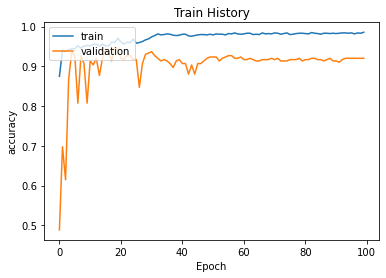

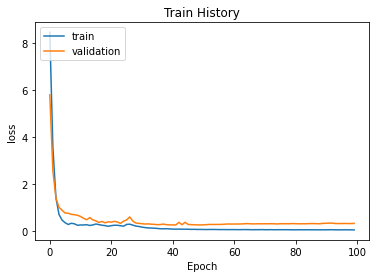

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_7.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 139us/step
check4: 7
** test loss: 0.3344564396281575
** test accuracy: 0.920265793800354


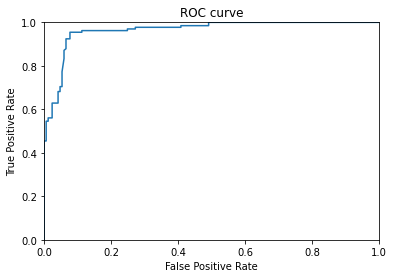


Acc : 0.92
Sen :  0.902
Spe :  0.935
AUC : 0.964
MCC : 0.838
f1-score : 0.908
Confusion_Matrix : 
 [[158  11]
 [ 13 119]] 


============================= CV 8 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 560
n: 640
##test:
p: 132
n: 169
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 1s - loss: 8.4356 - accuracy: 0.8583 - val_loss: 5.7639 - val_accuracy: 0.6047
Epoch 2/100
 - 0s - loss: 3.5851 - accuracy: 0.9283 - val_loss: 2.5897 - val_accuracy: 0.6080
Epoch 3/100
 - 1s - loss: 1.4406 - accuracy: 0.9350 - val_loss: 1.4220 - val_accuracy: 0.5316
Epoch 4/100
 - 0s - loss: 0.7616 - accuracy: 0.9267 - val_loss: 1.0515 - val_accuracy: 0.9402
Epoch 5/100
 - 0s - loss: 0.4751 - accuracy: 0.9442 - val_loss: 0.8693 - val_accuracy: 0.9468
Epoch 6/100
 - 0s - loss: 0.3549 - accuracy: 0.9442 - val_loss: 0.8096 - val_accuracy: 0.8904
Epoch 7/100
 - 0s - loss: 0.3166 - accuracy: 0.9458 - val_loss: 0.7454 - val_accuracy: 0.9535
Epoch 8/100
 - 0s - loss: 0.2839 - accuracy: 0.9558 - val_loss: 0.7038 - val_accuracy: 0.9468
Epoch 9/100
 - 0s - loss: 0.2740 - accuracy: 0.9475 - val_loss: 0.6785 - val_accuracy: 0.9435
Epoch 10/100
 - 0s - loss: 0.2941 - accuracy: 0.9475 - val_loss: 0.6056 - val_accuracy: 0.9269
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0625 - accuracy: 0.9825 - val_loss: 0.2740 - val_accuracy: 0.9336
Epoch 88/100
 - 0s - loss: 0.0657 - accuracy: 0.9842 - val_loss: 0.2777 - val_accuracy: 0.9336
Epoch 89/100
 - 0s - loss: 0.0642 - accuracy: 0.9817 - val_loss: 0.2879 - val_accuracy: 0.9269
Epoch 90/100
 - 0s - loss: 0.0621 - accuracy: 0.9817 - val_loss: 0.2861 - val_accuracy: 0.9269
Epoch 91/100
 - 0s - loss: 0.0628 - accuracy: 0.9808 - val_loss: 0.2850 - val_accuracy: 0.9269
Epoch 92/100
 - 0s - loss: 0.0624 - accuracy: 0.9833 - val_loss: 0.2813 - val_accuracy: 0.9302
Epoch 93/100
 - 0s - loss: 0.0633 - accuracy: 0.9825 - val_loss: 0.2811 - val_accuracy: 0.9302
Epoch 94/100
 - 0s - loss: 0.0614 - accuracy: 0.9825 - val_loss: 0.2798 - val_accuracy: 0.9369
Epoch 95/100
 - 0s - loss: 0.0608 - accuracy: 0.9817 - val_loss: 0.2840 - val_accuracy: 0.9302
Epoch 96/100
 - 0s - loss: 0.0610 - accuracy: 0.9825 - val_loss: 0.2859 - val_accuracy: 0.9269
Epoch 97/100
 - 0s - loss: 0.0633 - accuracy: 0.98

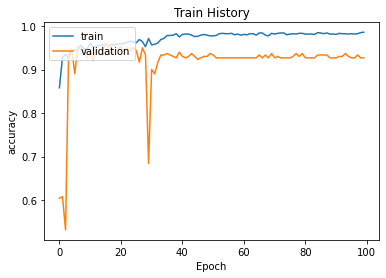

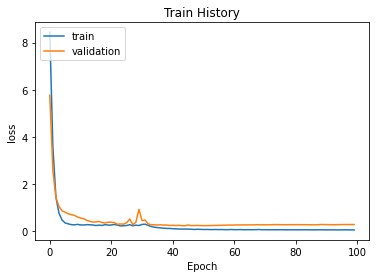

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_8.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 142us/step
check4: 8
** test loss: 0.288956090263354
** test accuracy: 0.9269102811813354


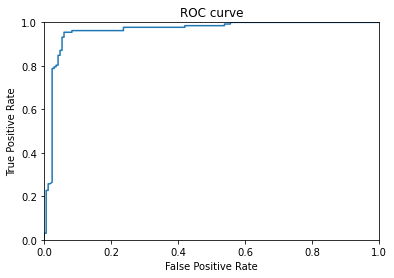


Acc : 0.927
Sen :  0.902
Spe :  0.947
AUC : 0.962
MCC : 0.851
f1-score : 0.915
Confusion_Matrix : 
 [[160   9]
 [ 13 119]] 


============================= CV 9 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 565
n: 635
##test:
p: 127
n: 174
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 2s - loss: 8.4848 - accuracy: 0.8692 - val_loss: 5.8125 - val_accuracy: 0.4784
Epoch 2/100
 - 0s - loss: 3.5854 - accuracy: 0.9217 - val_loss: 2.5883 - val_accuracy: 0.5183
Epoch 3/100
 - 0s - loss: 1.4383 - accuracy: 0.9375 - val_loss: 1.4095 - val_accuracy: 0.8306
Epoch 4/100
 - 0s - loss: 0.7187 - accuracy: 0.9375 - val_loss: 1.0387 - val_accuracy: 0.9203
Epoch 5/100
 - 0s - loss: 0.4493 - accuracy: 0.9492 - val_loss: 0.8694 - val_accuracy: 0.9169
Epoch 6/100
 - 0s - loss: 0.3530 - accuracy: 0.9417 - val_loss: 0.8104 - val_accuracy: 0.9269
Epoch 7/100
 - 0s - loss: 0.3371 - accuracy: 0.9508 - val_loss: 0.7225 - val_accuracy: 0.9136
Epoch 8/100
 - 0s - loss: 0.3668 - accuracy: 0.9508 - val_loss: 0.6309 - val_accuracy: 0.9435
Epoch 9/100
 - 0s - loss: 0.2959 - accuracy: 0.9600 - val_loss: 0.6398 - val_accuracy: 0.7409
Epoch 10/100
 - 0s - loss: 0.2973 - accuracy: 0.9458 - val_loss: 0.5588 - val_accuracy: 0.9336
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0768 - accuracy: 0.9842 - val_loss: 0.3390 - val_accuracy: 0.9236
Epoch 88/100
 - 0s - loss: 0.0770 - accuracy: 0.9833 - val_loss: 0.3405 - val_accuracy: 0.9236
Epoch 89/100
 - 0s - loss: 0.0763 - accuracy: 0.9833 - val_loss: 0.3419 - val_accuracy: 0.9236
Epoch 90/100
 - 0s - loss: 0.0758 - accuracy: 0.9842 - val_loss: 0.3432 - val_accuracy: 0.9236
Epoch 91/100
 - 0s - loss: 0.0791 - accuracy: 0.9833 - val_loss: 0.3424 - val_accuracy: 0.9236
Epoch 92/100
 - 0s - loss: 0.0733 - accuracy: 0.9825 - val_loss: 0.3435 - val_accuracy: 0.9236
Epoch 93/100
 - 0s - loss: 0.0738 - accuracy: 0.9842 - val_loss: 0.3450 - val_accuracy: 0.9169
Epoch 94/100
 - 0s - loss: 0.0737 - accuracy: 0.9858 - val_loss: 0.3441 - val_accuracy: 0.9236
Epoch 95/100
 - 0s - loss: 0.0808 - accuracy: 0.9833 - val_loss: 0.3418 - val_accuracy: 0.9236
Epoch 96/100
 - 0s - loss: 0.0740 - accuracy: 0.9850 - val_loss: 0.3437 - val_accuracy: 0.9236
Epoch 97/100
 - 0s - loss: 0.0709 - accuracy: 0.98

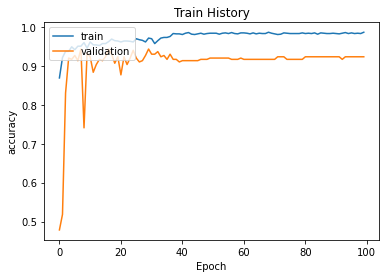

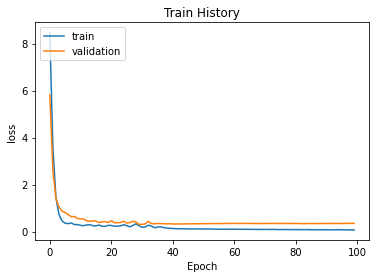

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_9.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 182us/step
check4: 9
** test loss: 0.34662145118776744
** test accuracy: 0.9235880374908447


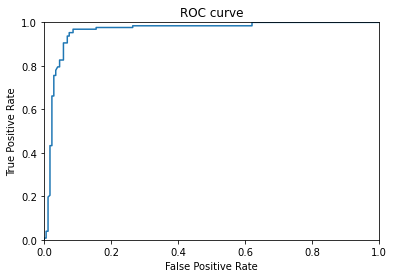


Acc : 0.924
Sen :  0.898
Spe :  0.943
AUC : 0.961
MCC : 0.843
f1-score : 0.908
Confusion_Matrix : 
 [[164  10]
 [ 13 114]] 


============================= CV 10 =============================
all: (1501, 238)
train_x: (1200, 238)
test_x: (301, 238)
##train:
p: 555
n: 645
##test:
p: 137
n: 164
##all:
p: 692
n: 809
pos_rate: 0.855

--------------------- Taining history ---------------------


C:\Users\bboyf\Anaconda3\envs\tf_gpu_shap\lib\site-packages\keras\callbacks\callbacks.py:998: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


Train on 1200 samples, validate on 301 samples
Epoch 1/100
 - 2s - loss: 8.5178 - accuracy: 0.8725 - val_loss: 5.8840 - val_accuracy: 0.7542
Epoch 2/100
 - 0s - loss: 3.6838 - accuracy: 0.9342 - val_loss: 2.6451 - val_accuracy: 0.8904
Epoch 3/100
 - 0s - loss: 1.4637 - accuracy: 0.9417 - val_loss: 1.4171 - val_accuracy: 0.7641
Epoch 4/100
 - 0s - loss: 0.7443 - accuracy: 0.9317 - val_loss: 1.0333 - val_accuracy: 0.8106
Epoch 5/100
 - 0s - loss: 0.4979 - accuracy: 0.9358 - val_loss: 0.8614 - val_accuracy: 0.8272
Epoch 6/100
 - 0s - loss: 0.3518 - accuracy: 0.9492 - val_loss: 0.7856 - val_accuracy: 0.5980
Epoch 7/100
 - 0s - loss: 0.3222 - accuracy: 0.9350 - val_loss: 0.7484 - val_accuracy: 0.9269
Epoch 8/100
 - 0s - loss: 0.3532 - accuracy: 0.9417 - val_loss: 0.6984 - val_accuracy: 0.9369
Epoch 9/100
 - 0s - loss: 0.3064 - accuracy: 0.9483 - val_loss: 0.6290 - val_accuracy: 0.9003
Epoch 10/100
 - 0s - loss: 0.2628 - accuracy: 0.9508 - val_loss: 0.6770 - val_accuracy: 0.6047
Epoch 11/100

Epoch 87/100
 - 0s - loss: 0.0707 - accuracy: 0.9792 - val_loss: 0.3325 - val_accuracy: 0.9236
Epoch 88/100
 - 0s - loss: 0.0708 - accuracy: 0.9783 - val_loss: 0.3328 - val_accuracy: 0.9236
Epoch 89/100
 - 0s - loss: 0.0715 - accuracy: 0.9775 - val_loss: 0.3305 - val_accuracy: 0.9236
Epoch 90/100
 - 0s - loss: 0.0730 - accuracy: 0.9783 - val_loss: 0.3329 - val_accuracy: 0.9236
Epoch 91/100
 - 0s - loss: 0.0672 - accuracy: 0.9800 - val_loss: 0.3298 - val_accuracy: 0.9236
Epoch 92/100
 - 0s - loss: 0.0714 - accuracy: 0.9767 - val_loss: 0.3341 - val_accuracy: 0.9203
Epoch 93/100
 - 0s - loss: 0.0706 - accuracy: 0.9783 - val_loss: 0.3392 - val_accuracy: 0.9203
Epoch 94/100
 - 0s - loss: 0.0694 - accuracy: 0.9792 - val_loss: 0.3362 - val_accuracy: 0.9203
Epoch 95/100
 - 0s - loss: 0.0704 - accuracy: 0.9783 - val_loss: 0.3342 - val_accuracy: 0.9203
Epoch 96/100
 - 0s - loss: 0.0692 - accuracy: 0.9808 - val_loss: 0.3351 - val_accuracy: 0.9236
Epoch 97/100
 - 0s - loss: 0.0699 - accuracy: 0.97

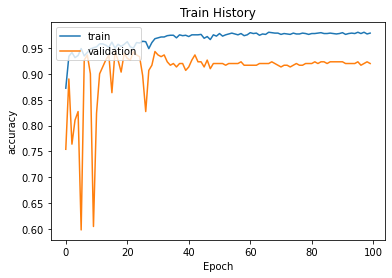

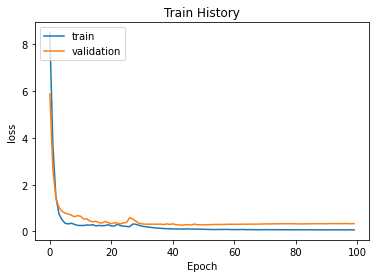

------------------------- Save model -------------------------
file:save_model/EGFR_family_DNN_model_cv_10.hdf5 

---------------------- Evalutation model ---------------------
301/301 [==============================] - 0s 161us/step
check4: 10
** test loss: 0.3368716699340415
** test accuracy: 0.920265793800354


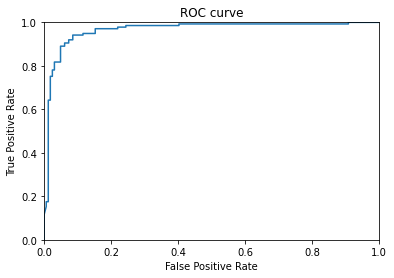


Acc : 0.92
Sen :  0.898
Spe :  0.939
AUC : 0.966
MCC : 0.839
f1-score : 0.911
Confusion_Matrix : 
 [[154  10]
 [ 14 123]] 

Wall time: 7min 42s


In [3]:
%%time

################# loading data ###################
protein = 'EGFR_family'
data_fp = pd.read_csv('data/EGFR_family_compounds.csv', header=None)

x_feature = data_fp.values[:, 2::]
y_label = data_fp.values[:, 0:2]
print("---------------------- Data information ----------------------")
print('EGFR_data:\n',data_fp.head(10))
print('x_feature:', x_feature.shape)
print('y_label:', y_label.shape)

################# performence index list #################
cv_acc = []
cv_sen = []
cv_spe = []
cv_auc = []
cv_mcc = []
cv_f1 = []

random_seed = 2
cv_n = 1

################### 10-CV random seed ###################
import random
random.seed(123)
random_seed = random.sample(range(1,1000),10)
print("\nrandom_seed:",len(random_seed),random_seed,'\n')

################ training model 10-CV ################
import figure_plot as fip
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix


cv_n = 1
for n in random_seed:
    print("\n============================= CV",str(cv_n),"=============================")

    ######################### split train and test data #########################
    train_x, test_x, train_smile_y, test_smile_y = train_test_split(x_feature, y_label, 
                                                                    train_size=0.8, test_size=0.2, 
                                                                    random_state=n)
    train_y = train_smile_y[:,1]
    test_y = test_smile_y[:,1]
    
    train_x = tf.keras.backend.cast_to_floatx(train_x)
    test_x = tf.keras.backend.cast_to_floatx(test_x)
    train_y = tf.keras.backend.cast_to_floatx(train_y)
    test_y = tf.keras.backend.cast_to_floatx(test_y)
    
    
    ################ data information ################
    print('all:', x_feature.shape)
    print('train_x:', train_x.shape)
    print('test_x:', test_x.shape)
    label_set = train_y.tolist()
    #label_set = label_set.reset_index(drop=True)
    label_count1 = label_set.count(1)
    label_count0 = label_set.count(0)
    print("##train:")
    print('p:',label_count1)
    print('n:',label_count0)
    
    label_set = test_y.tolist()
    #label_set = label_set.reset_index(drop=True)
    label_count1 = label_set.count(1)
    label_count0 = label_set.count(0)
    print("##test:")
    print('p:',label_count1)
    print('n:',label_count0)
    
    label_set = y_label[:,1].tolist()
    #label_set = label_set.reset_index(drop=True)
    label_count1 = label_set.count(1)
    label_count0 = label_set.count(0)
    print("##all:")
    print('p:',label_count1)
    print('n:',label_count0)
    print('pos_rate:',round(label_count1/label_count0,3))
    
    ############## creat model #############
    
    print("\n--------------------- Taining history ---------------------")
    model = Sequential()  # 宣告keras model
    
    model.add(Dense(1024, input_dim=238, kernel_initializer='uniform')) 
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    #model.add(Dropout(0.2))
    
    model.add(Dense(768, kernel_initializer='uniform', kernel_regularizer=regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Activation('relu')) 
    model.add(Dropout(0.2))
    
    model.add(Dense(512, kernel_initializer='uniform', kernel_regularizer=regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Activation('relu')) 
    model.add(Dropout(0.2))
    
    model.add(Dense(256, kernel_initializer='uniform', kernel_regularizer=regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Activation('relu')) 
    model.add(Dropout(0.2))
    model.add(Dense(units=1, kernel_initializer='uniform', kernel_regularizer=regularizers.l2(0.01)
                   , activation='sigmoid'))
    
    Adam = optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
    
    model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy']) 
    
    #################### setting learning rate #####################
    lrate = ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.1, 
        patience=5, 
        verbose=0, 
        mode='auto', 
        epsilon=0.0001, 
        cooldown=0, 
        min_lr=0.00001 )
    
    #################### training model #####################
    train_history = model.fit(x = train_x,
                  y = train_y,
                  validation_data = (test_x,test_y),
                  epochs = 100,
                  batch_size = 64,
                  verbose = 2,
                  callbacks = [lrate])
    
    print("check2:",cv_n)
    fip.show_train_history(train_history,'accuracy','val_accuracy')
    fip.show_train_history(train_history,'loss','val_loss')
    
    ########################### Save model ###########################
    save_model = "save_model/" + protein + "_DNN_model_cv_"+ str(cv_n)+".hdf5"
    model.save(save_model)
    print("------------------------- Save model -------------------------")
    print("file:" + save_model,"\n")
    
    
    ########################### Evalutation model ###########################
    print("---------------------- Evalutation model ---------------------")
    test_loss, test_acc = model.evaluate(test_x, test_y)
    print("check4:",cv_n)
    
    print ("** test loss: {}".format(test_loss))
    print ("** test accuracy: {}".format(test_acc))
    
    pred_prob = model.predict(test_x)     ## model prediction
    pred_class = model.predict_classes(test_x)     
    pred_class_train = model.predict_classes(train_x)     
    y_test = test_y.astype(float)
    
    fpr, tpr, thresholds = roc_curve(y_test, pred_prob, pos_label=1) ## calcuate ROC
    fip.plot_roc_curve(fpr,tpr)
    
    print ("\nAcc : {}".format(round(test_acc,3)))
    
    cm1 = confusion_matrix(y_test,pred_class)
    sensitivity1 = cm1[1,1]/(cm1[1,0]+cm1[1,1])  ## calcuate sen
    print('Sen : ', round(sensitivity1, 3))
    
    specificity1 = cm1[0,0]/(cm1[0,0]+cm1[0,1])  ## calcuate spe
    print('Spe : ', round(specificity1,3))
    
    auc_score = roc_auc_score(y_test, pred_prob)  ## calcuate auc
    print('AUC :', round(auc_score,3))
    
    mcc_score = metrics.matthews_corrcoef(y_test, pred_class, sample_weight=None)  ## calcuate mcc
    print('MCC :', round(mcc_score,3))
    
    f1_score = metrics.f1_score(y_test, pred_class)  ## calcuate f1_score
    print('f1-score :', round(f1_score,3))
    
    print('Confusion_Matrix : \n', cm1,'\n')
    
    cv_acc.append(round(test_acc,3))
    cv_sen.append(round(sensitivity1, 3))
    cv_spe.append(round(specificity1,3))
    cv_auc.append(round(auc_score,3))
    cv_mcc.append(round(mcc_score,3))
    cv_f1.append(round(f1_score,3))
    
    cv_n += 1
    


In [4]:
print("** 10-CV Performence index: **")
print('Acc:', cv_acc,"\t|ave:",round(np.mean(cv_acc),3), round(np.std(cv_acc),3))
print('Sen:', cv_sen,"\t|ave:",round(np.mean(cv_sen),3), round(np.std(cv_sen),3))
print('Spe:', cv_spe,"\t|ave:",round(np.mean(cv_spe),3), round(np.std(cv_spe),3))
print('AUC:', cv_auc,"\t|ave:",round(np.mean(cv_auc),3), round(np.std(cv_auc),3))
print('MCC:', cv_mcc,"\t|ave:",round(np.mean(cv_mcc),3), round(np.std(cv_mcc),3))
print('f1-score:', cv_f1,"\t|ave:",round(np.mean(cv_f1),3), round(np.std(cv_f1),3))

best_cv = cv_auc.index(max(cv_auc))+1
model_name = protein + "_DNN_model_cv" + str(best_cv) +".hdf5"
print("\n** AUC best model : ",model_name)


** 10-CV Performence index: **
Acc: [0.914, 0.93, 0.914, 0.934, 0.904, 0.94, 0.92, 0.927, 0.924, 0.92] 	|ave: 0.923 0.01
Sen: [0.938, 0.97, 0.89, 0.962, 0.937, 0.913, 0.902, 0.902, 0.898, 0.898] 	|ave: 0.921 0.027
Spe: [0.892, 0.899, 0.933, 0.912, 0.879, 0.967, 0.935, 0.947, 0.943, 0.939] 	|ave: 0.925 0.026
AUC: [0.957, 0.958, 0.966, 0.953, 0.955, 0.97, 0.964, 0.962, 0.961, 0.966] 	|ave: 0.961 0.005
MCC: [0.828, 0.863, 0.825, 0.868, 0.808, 0.882, 0.838, 0.851, 0.843, 0.839] 	|ave: 0.844 0.021
f1-score: [0.912, 0.924, 0.903, 0.926, 0.891, 0.938, 0.908, 0.915, 0.908, 0.911] 	|ave: 0.914 0.012

** AUC best model :  EGFR_family_DNN_model_cv6.hdf5


## Loading the trained model

In [5]:
from keras.models import load_model

best_cv = cv_auc.index(max(cv_auc))+1
model_name = protein + "_DNN_model_cv_" + str(best_cv) +".hdf5"
model_load = "save_model/" + model_name
print("** loading model:",model_load)
model = load_model(model_load)

test_loss, test_acc = model.evaluate(test_x, test_y)
print ("**load model acc : {}".format(test_acc))


** loading model: save_model/EGFR_family_DNN_model_cv_6.hdf5
301/301 [==============================] - 0s 1ms/step
**load model acc : 0.9767441749572754


## Calcuate DeepSHAP
Calculate the Shaply contribution value for each featurea in the DNN model.

In [6]:
import pandas as pd
import seaborn as sns
import keras
import shap

In [7]:
shap.initjs()

### Create an instance of the DeepSHAP which is called DeepExplainer
explainer_shap = shap.DeepExplainer(model=model,
                                 data=train_x)

### Fit the explainer on a subset of the data 
shap_values = explainer_shap.shap_values(X=train_x[::],
                                      ranked_outputs=True)

keras is no longer supported, please use tf.keras instead.


In [8]:
shap.force_plot(explainer_shap.expected_value, shap_values[0][0], train_x[::])

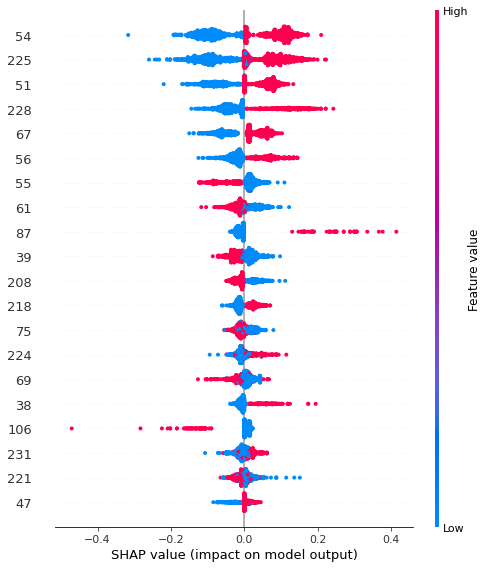

In [9]:
features = list(range(1,len(x_feature[0])+1))
### get the ovearall impact of each feature variable
shap.summary_plot(shap_values[0][0], train_x[::], feature_names=features)

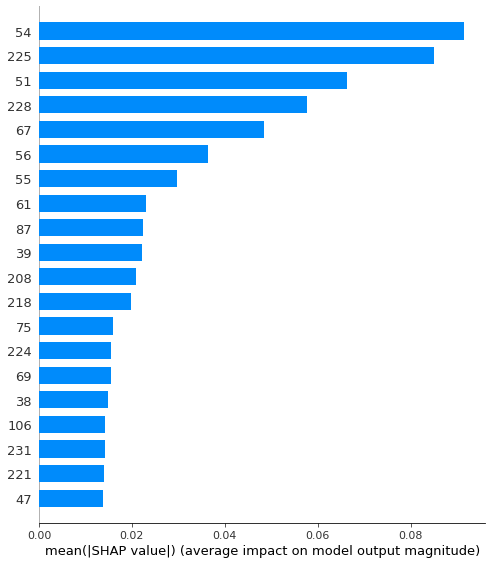

In [10]:
# Get the ovearall mean contribution of each feature variable
shap.summary_plot(shap_values[0][0], train_x[::], feature_names=features, plot_type="bar")
